Loading full data and will use SMOTE before modeling

In [82]:
#Importing libraries
import numpy as np
import pandas as pd
from skimpy import skim #summarizing dataframe
!pip install sklearn
from sklearn.preprocessing import MinMaxScaler
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve, precision_score, recall_score, f1_score
import matplotlib.pylab as plt

!pip install dmba
from dmba import plotDecisionTree, classificationSummary
#from dmba import backward_elimination, forward_selection, AIC_score


[notice] A new release of pip available: 22.3 -> 23.2.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip available: 22.3 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [83]:
#Loading data
df = pd.read_csv("Capstone_PCA_variables_v4.csv").drop(columns=['Unnamed: 0'])

In [84]:
#Create X and y dataframes
X = df.drop(columns=['TARGET'])
y = df['TARGET']

In [85]:
#Normalizing dataset
scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(X)
scaled_df = pd.DataFrame(scaled_df, columns=X.columns)

In [86]:
#split train and test
train_X, valid_X, train_y, valid_y = train_test_split(scaled_df, y, test_size=0.5, random_state = 1, stratify=y)
    #stratify ensures that both have the same general class ratio
print(train_X.shape)
print(valid_X.shape)

(16516, 71)
(16516, 71)


> SMOTE and Undersampling

In [87]:
!pip install imblearn
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTEENN
from imblearn.under_sampling import RandomUnderSampler


[notice] A new release of pip available: 22.3 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [88]:
# Apply SMOTE-ENN
smote_enn = SMOTEENN(sampling_strategy= 0.55, random_state=42)
X_resampled_enn, y_resampled_enn = smote_enn.fit_resample(train_X, train_y)

In [89]:
#Final train dataset
print("After SMOTE-ENN, counts of label '1': {}".format(sum(y_resampled_enn == 1)))
print("After SMOTE-ENN, counts of label '0': {}".format(sum(y_resampled_enn == 0)))
print('After SMOTE-ENN, the shape of train_X: {}'.format(X_resampled_enn.shape))

After SMOTE-ENN, counts of label '1': 7611
After SMOTE-ENN, counts of label '0': 9242
After SMOTE-ENN, the shape of train_X: (16853, 71)


In [90]:
#renaming
train_X = X_resampled_enn
train_y = y_resampled_enn

# Modeling

## Decision Tree

> One-node tree

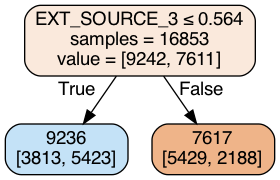

In [91]:
#One node tree for smote
classtree = DecisionTreeClassifier(max_depth=1, random_state=1)
classtree.fit(train_X, train_y)
plotDecisionTree(classtree, feature_names=train_X.columns)

> Full tree

In [92]:
column_names = ['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score']
combined_df = pd.DataFrame(columns=column_names)

# Define model names and an empty list to store metric results
model_names = ['Decision_Tree']  # Replace with your model names
metric_results = []

# Loop through each model
for model_name in model_names:
    # Create and fit the model
    classtree = DecisionTreeClassifier(random_state=1, class_weight='balanced')
    classtree.fit(train_X, train_y)
    
    # Make predictions
    y_pred = classtree.predict(valid_X)
    y_probs = classtree.predict_proba(valid_X)[:, 1]
    
    # Calculate metrics
    roc_auc = round(roc_auc_score(valid_y, y_probs), 2)
    precision = round(precision_score(valid_y, y_pred), 2)
    accuracy = round(accuracy_score(valid_y, y_pred), 2)
    recall = round(recall_score(valid_y, y_pred), 2)
    f1 = round(f1_score(valid_y, y_pred), 2)
    
    # Append the metric results to the list
    metric_results.append([model_name,roc_auc, precision, accuracy, recall,f1])

# Create a DataFrame from the metric results
metrics_df = pd.DataFrame(metric_results, columns=['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score'])
combined_df = pd.concat([combined_df, metrics_df], ignore_index=True, axis=0)

# Print the metrics DataFrame
print(metrics_df)

# Save the DataFrame to a CSV file
metrics_df.to_csv('model_metrics.csv', index=False)


           Model  ROC-AUC  Precision  Accuracy  Recall  F1_score
0  Decision_Tree     0.55       0.14      0.75     0.3      0.19


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.256626 to fit


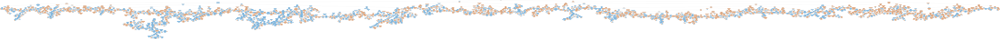

In [93]:
plotDecisionTree(classtree, feature_names=train_X.columns)

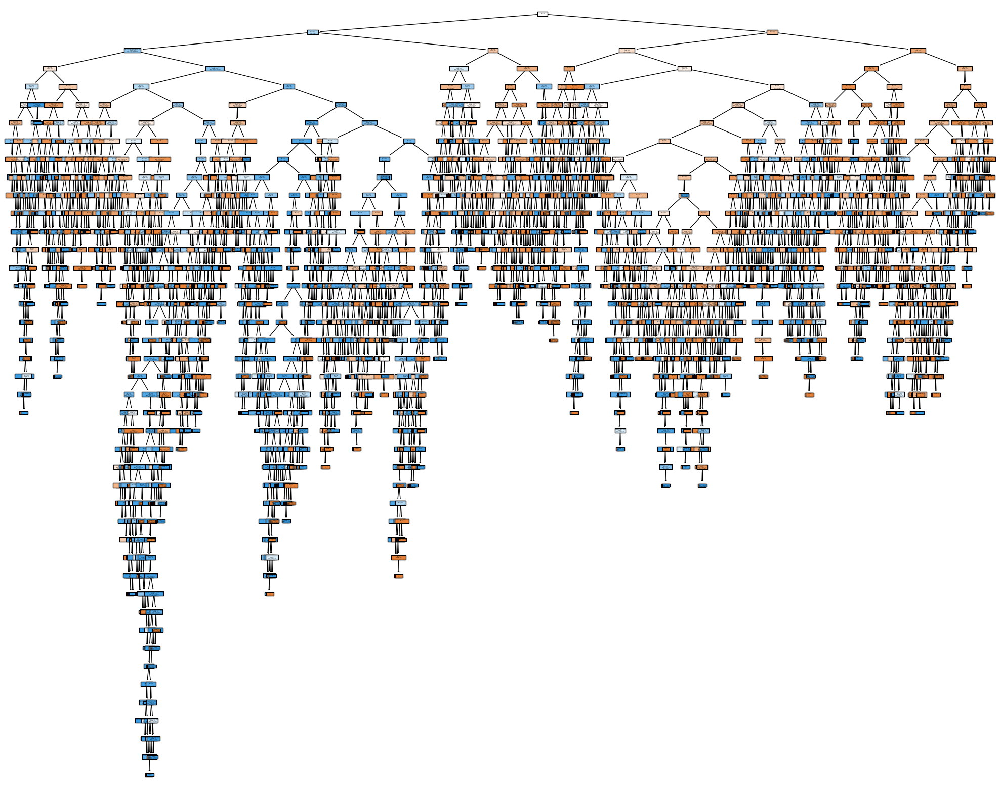

In [94]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(classtree, 
                   feature_names=train_X.columns,  
                   class_names=['not_default', 'default'],
                   filled=True)

ROC AUC Score: 0.549594744477894


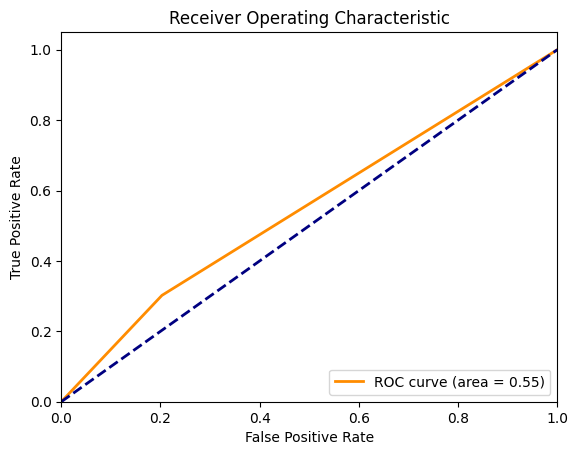

In [95]:
#ROC-AUC
# Predict probabilities on the test set
y_probs = classtree.predict_proba(valid_X)[:, 1]  # Probability scores for the positive class

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(valid_y, y_probs)
roc_auc = roc_auc_score(valid_y, y_probs)

# Print ROC AUC score
print("ROC AUC Score:", roc_auc)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [96]:
classificationSummary(valid_y, classtree.predict(valid_X), class_names=['not_default', 'default'])

Confusion Matrix (Accuracy 0.7496)

            Prediction
     Actual not_default     default
not_default       11903        3031
    default        1104         478


In [97]:
#Feature importance of classification tree
classtree_importance = pd.DataFrame({'feature': train_X.columns, 'importance': classtree.feature_importances_}).sort_values(by='importance', ascending=False)
classtree_importance.head(20)

,feature,importance
23,EXT_SOURCE_3,0.136759
35,EXT_SOURCE_2,0.097097
40,CF_OBS_30_CNT_SOCIAL_CIRCLE,0.069621
70,DAYS_ID_PUBLISH,0.051943
56,CC_AVG_AMT_DRAWINGS,0.051314
66,CF_CB_MONTHS_0_AVG,0.045810
20,EXT_SOURCE_1,0.043398
18,APARTMENTS_MEDI,0.034856
62,CNT_ACTIVE_LOANS,0.030753
24,PREV_AVG_DPD_DAYS,0.030673


In [98]:
# Get the total number of nodes in the tree
total_nodes = classtree.tree_.node_count

# Calculate the number of splits (internal nodes)
num_splits = total_nodes - 1
print("Number of Splits:", num_splits)

# Get the number of terminal nodes (leaf nodes)
num_terminal_nodes = classtree.tree_.n_leaves
print("Number of Terminal Nodes:", num_terminal_nodes)

Number of Splits: 4254
Number of Terminal Nodes: 2128


In [99]:
#Checking the first 5 splits:
feature_names = train_X.columns
# Create a list to store split details as dictionaries
split_details = []

# Extract split details for the first 5 splits
for split_num in range(5):
    feature_index = classtree.tree_.feature[split_num]
    feature_name = feature_names[feature_index]  # Get feature name using index
    threshold = classtree.tree_.threshold[split_num]
    split_details.append({"Split Number": split_num + 1,
                          "Feature Name": feature_name,
                          "Threshold": threshold})

# Create a DataFrame from the list of split details
split_df = pd.DataFrame(split_details)
split_df

,Split Number,Feature Name,Threshold
0,1,EXT_SOURCE_3,0.564357
1,2,EXT_SOURCE_2,0.761995
2,3,NAME_EDUCATION_TYPE_Secondary,0.000790
3,4,CNT_FAM_MEMBERS_1-2,0.946986
4,5,CNT_FAM_MEMBERS_1-2,0.003263


> Gridsearch Classification Tree

In [100]:
param_grid = {'max_depth': [40, 50,60,70],
              'min_samples_split' : [2,5,10,20,30,40], #based on number of records
              'min_impurity_decrease': [0.05,0.02,0.01, 0.001,0.0001, 0.00001]}

In [101]:
gridsearch = GridSearchCV(DecisionTreeClassifier(random_state=1, class_weight='balanced'), 
                          param_grid, cv=5, n_jobs = -1)
gridsearch.fit(train_X, train_y)
bestregtree = gridsearch.best_estimator_
print(gridsearch.best_params_)
plotDecisionTree(bestregtree, feature_names=train_X.columns)

{'max_depth': 40, 'min_impurity_decrease': 0.0001, 'min_samples_split': 2}


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.480673 to fit


In [102]:
# Define model names and an empty list to store metric results
model_names = ['Decision_Tree_GridSearch']  # Replace with your model names
metric_results = []

# Loop through each model
for model_name in model_names:
    # Create and fit the model
    classtree_gs = DecisionTreeClassifier(random_state=1, class_weight='balanced',max_depth=40, min_impurity_decrease=0.0001, min_samples_split=2)
    classtree_gs.fit(train_X, train_y)
    
    # Make predictions
    y_pred = classtree_gs.predict(valid_X)
    y_probs = classtree_gs.predict_proba(valid_X)[:, 1]
    
    # Calculate metrics
    roc_auc = round(roc_auc_score(valid_y, y_probs), 2)
    precision = round(precision_score(valid_y, y_pred), 2)
    accuracy = round(accuracy_score(valid_y, y_pred), 2)
    recall = round(recall_score(valid_y, y_pred), 2)
    f1 = round(f1_score(valid_y, y_pred), 2)
    
    # Append the metric results to the list
    metric_results.append([model_name,roc_auc, precision, accuracy, recall,f1])

# Create a DataFrame from the metric results
metrics_df = pd.DataFrame(metric_results, columns=['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score'])
combined_df = pd.concat([combined_df, metrics_df], ignore_index=True, axis=0)

# Print the metrics DataFrame
print(combined_df)

# Save the DataFrame to a CSV file
combined_df.to_csv('model_metrics.csv', index=False)


                      Model  ROC-AUC  Precision  Accuracy  Recall  F1_score
0             Decision_Tree     0.55       0.14      0.75    0.30      0.19
1  Decision_Tree_GridSearch     0.53       0.14      0.74    0.33      0.20


ROC AUC Score: 0.5306910668212788


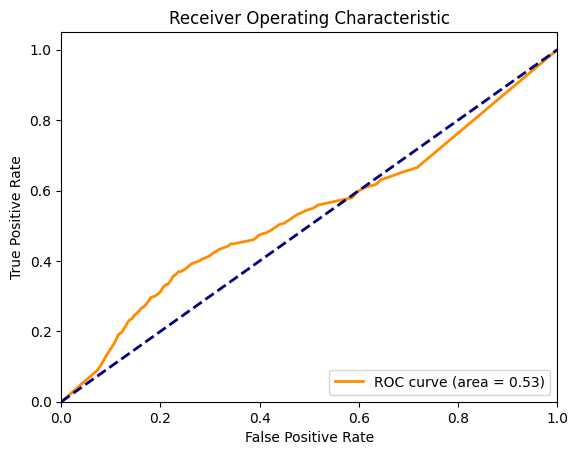

In [103]:
#ROC-AUC for smote
# Predict probabilities on the test set
y_probs = classtree_gs.predict_proba(valid_X)[:, 1]  # Probability scores for the positive class

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(valid_y, y_probs)
roc_auc = roc_auc_score(valid_y, y_probs)

# Print ROC AUC score
print("ROC AUC Score:", roc_auc)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [104]:
classificationSummary(valid_y, classtree_gs.predict(valid_X), class_names=['not_default', 'default'])

Confusion Matrix (Accuracy 0.7435)

            Prediction
     Actual not_default     default
not_default       11753        3181
    default        1055         527


In [105]:
#Feature importance of classification tree
classtreegs_importance = pd.DataFrame({'feature': train_X.columns, 'importance': classtree_gs.feature_importances_}).sort_values(by='importance', ascending=False)
classtreegs_importance.head(20)

,feature,importance
23,EXT_SOURCE_3,0.146449
35,EXT_SOURCE_2,0.101237
40,CF_OBS_30_CNT_SOCIAL_CIRCLE,0.075676
56,CC_AVG_AMT_DRAWINGS,0.051743
20,EXT_SOURCE_1,0.042926
70,DAYS_ID_PUBLISH,0.040677
66,CF_CB_MONTHS_0_AVG,0.039294
62,CNT_ACTIVE_LOANS,0.033454
21,NAME_EDUCATION_TYPE_Secondary,0.032491
18,APARTMENTS_MEDI,0.032448


## Logistic Regression

> Full regression

In [18]:
# Define model names and an empty list to store metric results
model_names = ['Logistic_Regression_Full']  # Replace with your model names
metric_results = []

# Loop through each model
for model_name in model_names:
    # Create and fit the model
    logit_reg = LogisticRegression(max_iter=1500, C=1e42, random_state=4, solver='liblinear', class_weight='balanced')
    logit_reg.fit(train_X, train_y)
    
    # Make predictions
    y_pred = logit_reg.predict(valid_X)
    y_probs = logit_reg.predict_proba(valid_X)[:, 1]
    
    # Calculate metrics
    roc_auc = round(roc_auc_score(valid_y, y_probs), 2)
    precision = round(precision_score(valid_y, y_pred), 2)
    accuracy = round(accuracy_score(valid_y, y_pred), 2)
    recall = round(recall_score(valid_y, y_pred), 2)
    f1 = round(f1_score(valid_y, y_pred), 2)
    
    # Append the metric results to the list
    metric_results.append([model_name,roc_auc, precision, accuracy, recall,f1])

# Create a DataFrame from the metric results
metrics_df = pd.DataFrame(metric_results, columns=['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score'])
combined_df = pd.concat([combined_df, metrics_df], ignore_index=True, axis=0)
# Print the metrics DataFrame
print(combined_df)

# Save the DataFrame to a CSV file
combined_df.to_csv('model_metrics.csv', index=False)


                      Model  ROC-AUC  Precision  Accuracy  Recall  F1_score
0             Decision_Tree     0.55       0.14      0.75    0.30      0.19
1  Decision_Tree_GridSearch     0.53       0.14      0.74    0.33      0.20
2  Logistic_Regression_Full     0.69       0.16      0.64    0.64      0.26


ROC AUC Score: 0.6920853356115412


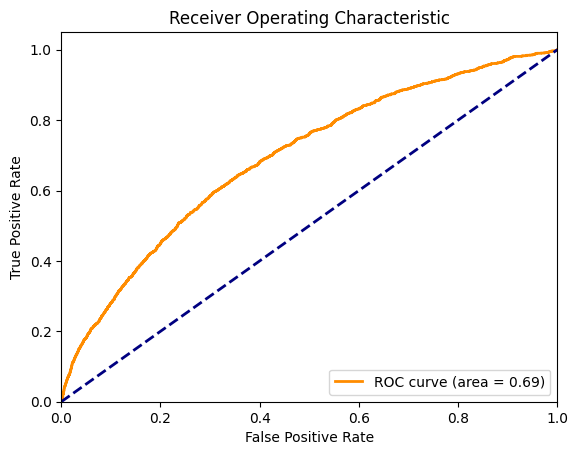

In [19]:
#ROC-AUC

# Predict probabilities on the test set
y_probs = logit_reg.predict_proba(valid_X)[:, 1]  # Probability scores for the positive class

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(valid_y, y_probs)
roc_auc = roc_auc_score(valid_y, y_probs)

# Print ROC AUC score
print("ROC AUC Score:", roc_auc)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [123]:
classificationSummary(valid_y, logit_reg.predict(valid_X), class_names=['not_default', 'default'])

Confusion Matrix (Accuracy 0.6442)

            Prediction
     Actual not_default     default
not_default        9624        5310
    default         566        1016


In [127]:
#Unscale the coefficients
coefficients_unscaled = scaler.inverse_transform(logit_reg.coef_)

odds_ratio = pd.DataFrame({'coef': logit_reg.coef_[0], 'unscaled_coef': coefficients_unscaled[0],
              'odds_ratio': np.exp(coefficients_unscaled[0])}, index = train_X.columns)
logit_pred_test = logit_reg.predict(valid_X)
logit_proba_test = logit_reg.predict_proba(valid_X)
log_result_test = pd.DataFrame({'actual': valid_y, 
                                  'predicted': logit_pred_test, 
              'prob_0': [p[0] for p in logit_proba_test],
              'prob_1': [p[1] for p in logit_proba_test]})
log_result_test
classes = ['not default','default']
logit_importance = odds_ratio.sort_values(by=['odds_ratio'], ascending=False)
logit_importance.head(10)

,coef,unscaled_coef,odds_ratio
CB_AMT_CREDIT_SUM_OVERDUE_76-100k,52.129846,52.129846,4.362191e+22
AMT_REQ_CREDIT_BUREAU_WEEK,1.869310,4.832095,1.254736e+02
CB_MONTHS_5_AVG,0.582999,1.739646,5.695327e+00
NAME_INCOME_TYPE_Employed,1.098454,1.098454,2.999525e+00
CB_SEC_LOAN_0,0.898402,0.898402,2.455675e+00
DEF_30_CNT_SOCIAL_CIRCLE,0.356186,0.827037,2.286534e+00
OCCUPATION_TYPE_8_Operators_Assemblers,0.555104,0.555104,1.742122e+00
OWN_CAR_AGE_21-25,0.512366,0.512366,1.669235e+00
FLAG_OWN_CAR_N,0.508808,0.508808,1.663307e+00
NAME_EDUCATION_TYPE_Secondary,0.485060,0.485060,1.624273e+00


> Logistic Regression CV

In [21]:
from sklearn.linear_model import LogisticRegressionCV

In [22]:
# Define model names and an empty list to store metric results
model_names = ['Logistic_Regression_CV']  # Replace with your model names
metric_results = []

# Loop through each model
for model_name in model_names:
    # Create and fit the model
    logit_cv = LogisticRegressionCV(max_iter=1500, cv=5, random_state=4, solver='liblinear', class_weight='balanced') # Replace with your model initialization
    logit_cv.fit(train_X, train_y)
    
    # Make predictions
    y_pred = logit_cv.predict(valid_X)
    y_probs = logit_cv.predict_proba(valid_X)[:, 1]
    
    # Calculate metrics
    roc_auc = round(roc_auc_score(valid_y, y_probs), 2)
    precision = round(precision_score(valid_y, y_pred), 2)
    accuracy = round(accuracy_score(valid_y, y_pred), 2)
    recall = round(recall_score(valid_y, y_pred), 2)
    f1 = round(f1_score(valid_y, y_pred), 2)
    
    # Append the metric results to the list
    metric_results.append([model_name,roc_auc, precision, accuracy, recall,f1])

# Create a DataFrame from the metric results
metrics_df = pd.DataFrame(metric_results, columns=['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score'])
combined_df = pd.concat([combined_df, metrics_df], ignore_index=True, axis=0)

# Print the metrics DataFrame
print(combined_df)

# Save the DataFrame to a CSV file
combined_df.to_csv('model_metrics.csv', index=False)


                      Model  ROC-AUC  Precision  Accuracy  Recall  F1_score
0             Decision_Tree     0.55       0.14      0.75    0.30      0.19
1  Decision_Tree_GridSearch     0.53       0.14      0.74    0.33      0.20
2  Logistic_Regression_Full     0.69       0.16      0.64    0.64      0.26
3    Logistic_Regression_CV     0.69       0.16      0.64    0.64      0.26


ROC AUC Score: 0.6922201047440597


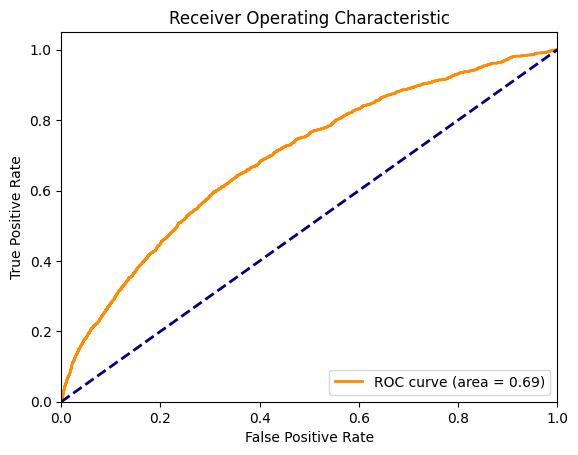

In [23]:

# Predict probabilities on the test set
y_probs = logit_cv.predict_proba(valid_X)[:, 1]  # Probability scores for the positive class

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(valid_y, y_probs)
roc_auc = roc_auc_score(valid_y, y_probs)

# Print ROC AUC score
print("ROC AUC Score:", roc_auc)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

> Gridsearch Logistic Regression

In [24]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import make_scorer
from sklearn.model_selection import GridSearchCV, cross_validate

In [128]:
#for smote
# Define logistic regression model
model = LogisticRegression(random_state=42, max_iter=3000, class_weight='balanced')

# Define hyperparameter grid
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization parameter
    'penalty': ['l1', 'l2'],              # Regularization type
    'solver': ['liblinear', 'lbfgs', 'newton-cg', 'sag', 'saga']  # Optimization algorithm
}

# Create GridSearchCV object
grid_search2 = GridSearchCV(estimator=model, param_grid=param_grid, scoring='roc_auc', cv=5)

# Fit the grid search to the training data
grid_search2.fit(train_X, train_y)

# Print best hyperparameters and corresponding ROC AUC score
print("Best Hyperparameters:", grid_search2.best_params_)
print("Best ROC AUC Score:", grid_search2.best_score_)


/Users/marianilagan/py_scripts/.venv/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/marianilagan/py_scripts/.venv/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/marianilagan/py_scripts/.venv/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/marianilagan/py_scripts/.venv/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


KeyboardInterrupt: 

In [13]:
# Define model names and an empty list to store metric results
model_names = ['Logistic_Regression_Grid'] 
metric_results = []

# Loop through each model
for model_name in model_names:
    # Create and fit the model
    logit_gs = LogisticRegression(max_iter=2500, C=1e42, penalty='l1', random_state=4, solver='saga', class_weight='balanced')
    logit_gs.fit(train_X, train_y)
    
    # Make predictions
    y_pred = logit_gs.predict(valid_X)
    y_probs = logit_gs.predict_proba(valid_X)[:, 1]
    
    # Calculate metrics
    roc_auc = round(roc_auc_score(valid_y, y_probs), 2)
    precision = round(precision_score(valid_y, y_pred), 2)
    accuracy = round(accuracy_score(valid_y, y_pred), 2)
    recall = round(recall_score(valid_y, y_pred), 2)
    f1 = round(f1_score(valid_y, y_pred), 2)
    
    # Append the metric results to the list
    metric_results.append([model_name,roc_auc, precision, accuracy, recall,f1])

# Create a DataFrame from the metric results
metrics_df = pd.DataFrame(metric_results, columns=['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score'])
combined_df = pd.concat([combined_df, metrics_df], ignore_index=True, axis=0)

# Print the metrics DataFrame
print(combined_df)

# Save the DataFrame to a CSV file
combined_df.to_csv('model_metrics.csv', index=False)


                      Model  ROC-AUC  Precision  Accuracy  Recall  F1_score
0             Decision_Tree     0.55       0.14      0.75    0.30      0.19
1  Logistic_Regression_Grid     0.69       0.16      0.64    0.64      0.26


/Users/marianilagan/py_scripts/.venv/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


ROC AUC Score: 0.6921055255852256


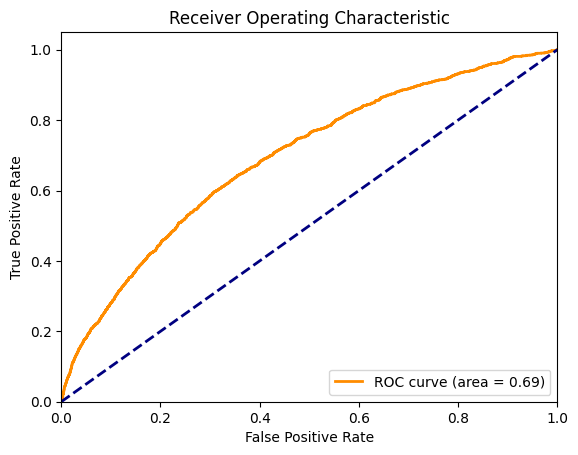

In [14]:
# Predict probabilities on the test set
y_probs = logit_gs.predict_proba(valid_X)[:, 1]  # Probability scores for the positive class

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(valid_y, y_probs)
roc_auc = roc_auc_score(valid_y, y_probs)

# Print ROC AUC score
print("ROC AUC Score:", roc_auc)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [17]:
#Unscale the coefficients
coefficients_unscaled = scaler.inverse_transform(logit_gs.coef_)

odds_ratio = pd.DataFrame({'coef': logit_gs.coef_[0], 'unscaled_coef': coefficients_unscaled[0],
              'odds_ratio': np.exp(coefficients_unscaled[0])}, index = train_X.columns)
logit_pred_test = logit_gs.predict(valid_X)
logit_proba_test = logit_gs.predict_proba(valid_X)
log_result_test = pd.DataFrame({'actual': valid_y, 
                                  'predicted': logit_pred_test, 
              'prob_0': [p[0] for p in logit_proba_test],
              'prob_1': [p[1] for p in logit_proba_test]})
log_result_test
classes = ['not default','default']
logit_gs_importance = odds_ratio.sort_values(by=['odds_ratio'], ascending=False)
logit_gs_importance.head(10)

,coef,unscaled_coef,odds_ratio
CB_AMT_CREDIT_SUM_OVERDUE_76-100k,23.472148,23.472148,1.562515e+10
AMT_REQ_CREDIT_BUREAU_WEEK,1.869023,4.831354,1.253807e+02
CB_MONTHS_5_AVG,0.582193,1.731370,5.648386e+00
NAME_INCOME_TYPE_Employed,1.098469,1.098469,2.999570e+00
CB_SEC_LOAN_0,0.898031,0.898031,2.454764e+00
DEF_30_CNT_SOCIAL_CIRCLE,0.356314,0.827336,2.287217e+00
OCCUPATION_TYPE_8_Operators_Assemblers,0.555056,0.555056,1.742038e+00
OWN_CAR_AGE_21-25,0.512198,0.512198,1.668955e+00
FLAG_OWN_CAR_N,0.508759,0.508759,1.663226e+00
NAME_EDUCATION_TYPE_Secondary,0.484455,0.484455,1.623290e+00


## Random Forest

In [71]:
# Define model names and an empty list to store metric results
model_names = ['Random_Forest'] 
metric_results = []

# Loop through each model
for model_name in model_names:
    # Create and fit the model
    rf = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42, class_weight='balanced')
    rf.fit(train_X, train_y)
    
    # Make predictions
    y_pred = rf.predict(valid_X)
    y_probs = rf.predict_proba(valid_X)[:, 1]
    
    # Calculate metrics
    roc_auc = round(roc_auc_score(valid_y, y_probs), 2)
    precision = round(precision_score(valid_y, y_pred), 2)
    accuracy = round(accuracy_score(valid_y, y_pred), 2)
    recall = round(recall_score(valid_y, y_pred), 2)
    f1 = round(f1_score(valid_y, y_pred), 2)
    
    # Append the metric results to the list
    metric_results.append([model_name,roc_auc, precision, accuracy, recall,f1])

# Create a DataFrame from the metric results
metrics_df = pd.DataFrame(metric_results, columns=['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score'])
combined_df = pd.concat([combined_df, metrics_df], ignore_index=True, axis=0)

# Print the metrics DataFrame
print(combined_df)

# Save the DataFrame to a CSV file
combined_df.to_csv('model_metrics.csv', index=False)


                      Model  ROC-AUC  Precision  Accuracy  Recall  F1_score
0             Decision_Tree     0.55       0.14      0.75    0.30      0.19
1  Logistic_Regression_Grid     0.69       0.16      0.64    0.64      0.26
2             Random_Forest     0.69       0.19      0.77    0.41      0.26
3       Random_Forest_tuned     0.69       0.20      0.84    0.22      0.21
4                       SGD     0.69       0.17      0.68    0.59      0.26
5                   XGBoost     0.67       0.22      0.86    0.18      0.20
6             XGBoost_tuned     0.69       0.23      0.86    0.17      0.20
7  Decision_Tree_GridSearch     0.53       0.14      0.74    0.33      0.20
8             Random_Forest     0.69       0.19      0.77    0.41      0.26


ROC AUC Score: 0.6932980884962525


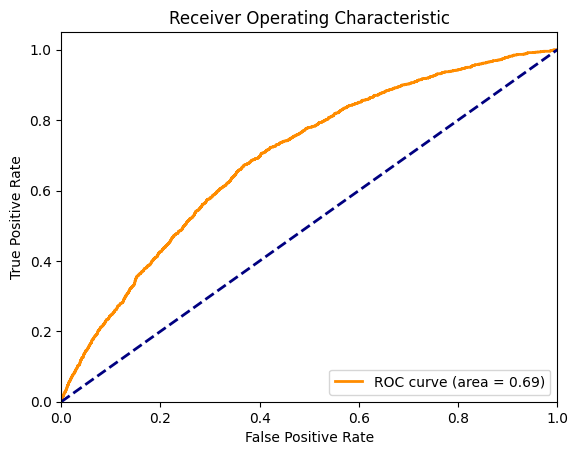

In [72]:
# Predict probabilities on the test set
y_probs = rf.predict_proba(valid_X)[:, 1]  # Probability scores for the positive class

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(valid_y, y_probs)
roc_auc = roc_auc_score(valid_y, y_probs)

# Print ROC AUC score
print("ROC AUC Score:", roc_auc)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [73]:
classificationSummary(valid_y, rf.predict(valid_X), class_names=['not_default', 'default'])

Confusion Matrix (Accuracy 0.7745)

            Prediction
     Actual not_default     default
not_default       12151        2783
    default         941         641


In [74]:
importance = rf.feature_importances_ #%of the variance that can be explained by that variable
std=np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
rf_df = pd.DataFrame({'feature': train_X.columns,
                   'importance': importance,
                   'std': std})
rf_df.sort_values('importance', ascending = False).head(10)

,feature,importance,std
23,EXT_SOURCE_3,0.127707,0.064448
35,EXT_SOURCE_2,0.091543,0.045666
20,EXT_SOURCE_1,0.065193,0.039288
56,CC_AVG_AMT_DRAWINGS,0.054896,0.042680
27,CB_AVG_DAYS_CREDIT_ENDDATE_2yrs+,0.053068,0.038899
21,NAME_EDUCATION_TYPE_Secondary,0.048634,0.040009
62,CNT_ACTIVE_LOANS,0.043797,0.034933
40,CF_OBS_30_CNT_SOCIAL_CIRCLE,0.040103,0.041944
60,INS_AVG_LATE_PAYMENT_zero,0.034493,0.025104
8,NAME_INCOME_TYPE_Employed,0.033137,0.027070


Text(0.5, 1.0, 'Top 30 Feature Importance - Random Forest')

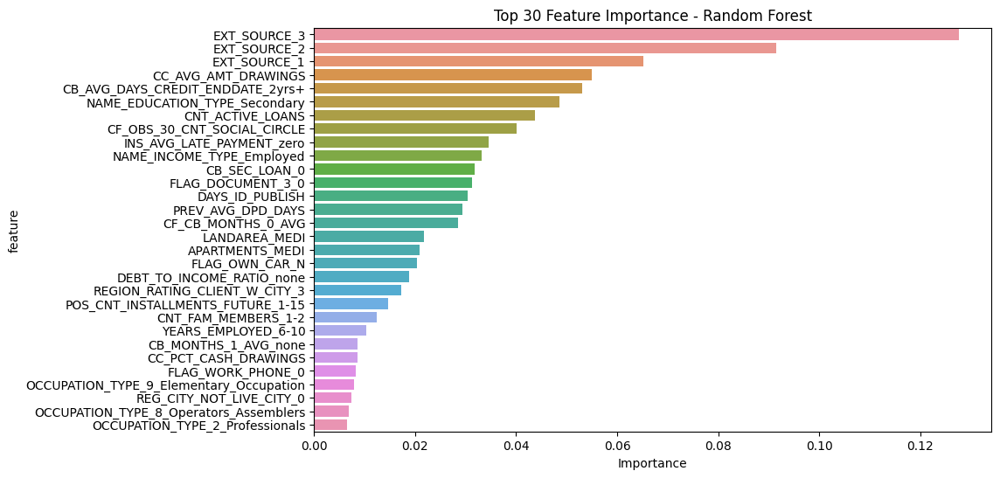

In [75]:
import seaborn as sns

importance = rf.feature_importances_ #%of the variance that can be explained by that variable
std=np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
rf_df = pd.DataFrame({'feature': train_X.columns,
                   'importance': importance,
                   'std': std})
                   
# Limit to top 30 features
top_30_df = rf_df.sort_values('importance', ascending = False).head(30)
top_30_df = top_30_df.sort_values('importance', ascending=False)

# Create a horizontal bar plot using Seaborn
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
ax = sns.barplot(data=top_30_df, x='importance', y='feature')

# Set plot labels and title
ax.set_xlabel('Importance')
ax.set_title('Top 30 Feature Importance - Random Forest')

> Random search Random Forest

In [ ]:
#Gridsearch for smote
import numpy as np
import pandas as pd
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestClassifier

# Define the parameter grid for Random Forest
#param_grid = {
    'n_estimators': np.arange(50, 300, 500),
    'max_depth': np.arange(5, 20, 1),
    'min_samples_split': np.arange(2, 10, 1),
    'min_samples_leaf': np.arange(1, 10, 1),
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True, False]
}

# Create a Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)

# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(
    estimator=rf_classifier,
    param_distributions=param_grid,
    n_iter=50,  # Number of parameter settings that are sampled
    scoring='roc_auc',  # Use roc for evaluation
    cv=5,  # Cross-validation folds
    verbose=1,
    n_jobs=-1,  # Use all available CPU cores
    random_state=42
)

# Fit the RandomizedSearchCV object to the data
random_search.fit(train_X, train_y)

# Print the best parameters found during the search
print("Best Parameters:", random_search.best_params_)

# Evaluate the best model on the test set
best_model = random_search.best_estimator_
test_accuracy = best_model.score(valid_X, valid_y)
print("Test Accuracy:", test_accuracy)

# Evaluate the best model on the test set using ROC AUC
best_model = random_search.best_estimator_
y_pred_proba = best_model.predict_proba(valid_X)[:, 1]
roc_auc = roc_auc_score(valid_y, y_pred_proba)
print("Test ROC AUC:", roc_auc)

Results for randomized search:  
Best Parameters: {'n_estimators': 250, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 19, 'bootstrap': False}  
Test Accuracy: 0.8604989101477355
Test ROC AUC: 0.694444768951359

In [36]:
# Define model names and an empty list to store metric results
model_names = ['Random_Forest_tuned']  # Replace with your model names
metric_results = []

# Loop through each model
for model_name in model_names:
    # Create and fit the model
    rf_tuned = RandomForestClassifier(n_estimators = 250, min_samples_split = 5, min_samples_leaf= 2, 
                    max_features= 'sqrt', max_depth= 19, bootstrap= False, random_state=42, class_weight='balanced')
    rf_tuned.fit(train_X, train_y)
    
    # Make predictions
    y_pred = rf_tuned.predict(valid_X)
    y_probs = rf_tuned.predict_proba(valid_X)[:, 1]
    
    # Calculate metrics
    roc_auc = round(roc_auc_score(valid_y, y_probs), 2)
    precision = round(precision_score(valid_y, y_pred), 2)
    accuracy = round(accuracy_score(valid_y, y_pred), 2)
    recall = round(recall_score(valid_y, y_pred), 2)
    f1 = round(f1_score(valid_y, y_pred), 2)
    
    # Append the metric results to the list
    metric_results.append([model_name,roc_auc, precision, accuracy, recall,f1])

# Create a DataFrame from the metric results
metrics_df = pd.DataFrame(metric_results, columns=['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score'])
combined_df = pd.concat([combined_df, metrics_df], ignore_index=True, axis=0)

# Print the metrics DataFrame
print(combined_df)

# Save the DataFrame to a CSV file
combined_df.to_csv('model_metrics.csv', index=False)


                      Model  ROC-AUC  Precision  Accuracy  Recall  F1_score
0             Decision_Tree     0.55       0.14      0.75    0.30      0.19
1  Logistic_Regression_Grid     0.69       0.16      0.64    0.64      0.26
2             Random_Forest     0.69       0.19      0.77    0.41      0.26
3       Random_Forest_tuned     0.69       0.20      0.84    0.22      0.21


ROC AUC Score: 0.6920971448414321


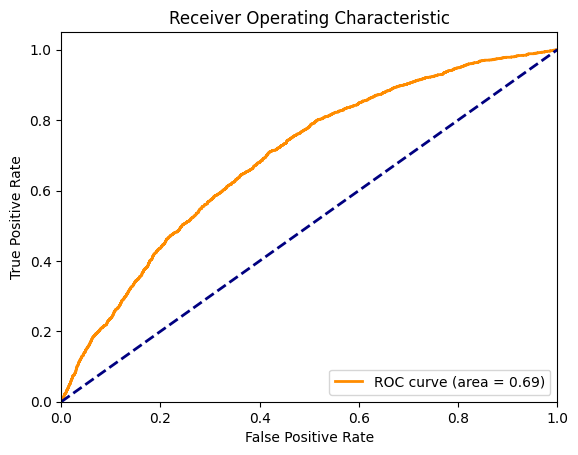

In [37]:
# Predict probabilities on the test set
y_probs = rf_tuned.predict_proba(valid_X)[:, 1]  # Probability scores for the positive class

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(valid_y, y_probs)
roc_auc = roc_auc_score(valid_y, y_probs)

# Print ROC AUC score
print("ROC AUC Score:", roc_auc)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [38]:
classificationSummary(valid_y, rf_tuned.predict(valid_X), class_names=['not_default', 'default'])

Confusion Matrix (Accuracy 0.8425)

            Prediction
     Actual not_default     default
not_default       13565        1369
    default        1232         350


In [44]:
importance_tuned = rf_tuned.feature_importances_ #%of the variance that can be explained by that variable
std=np.std([tree.feature_importances_ for tree in rf_tuned.estimators_], axis=0)
rf_tuned_df = pd.DataFrame({'feature': train_X.columns,
                   'importance': importance_tuned,
                   'std': std})
rf_tuned_df.sort_values('importance', ascending = False).head(10)

,feature,importance,std
23,EXT_SOURCE_3,0.104575,0.032396
35,EXT_SOURCE_2,0.084820,0.020308
20,EXT_SOURCE_1,0.062312,0.022485
56,CC_AVG_AMT_DRAWINGS,0.048537,0.020402
40,CF_OBS_30_CNT_SOCIAL_CIRCLE,0.044841,0.021814
27,CB_AVG_DAYS_CREDIT_ENDDATE_2yrs+,0.040460,0.020751
66,CF_CB_MONTHS_0_AVG,0.040429,0.006007
70,DAYS_ID_PUBLISH,0.040116,0.008397
62,CNT_ACTIVE_LOANS,0.039444,0.018973
21,NAME_EDUCATION_TYPE_Secondary,0.036431,0.019521


Text(0.5, 1.0, 'Top 30 Feature Importance - Random Forest - Tuned')

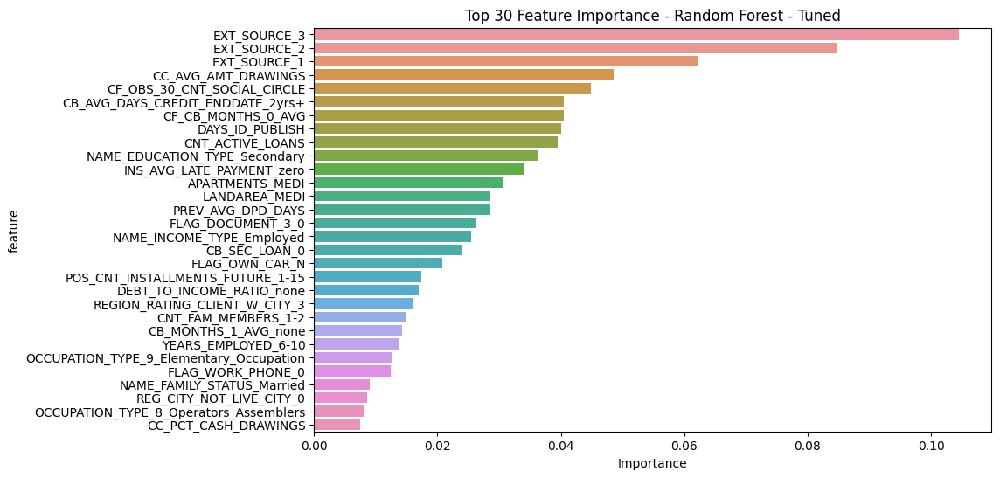

In [48]:
import seaborn as sns

importance_tuned = rf_tuned.feature_importances_ #%of the variance that can be explained by that variable
std=np.std([tree.feature_importances_ for tree in rf_tuned.estimators_], axis=0)
rf_tuned_df = pd.DataFrame({'feature': train_X.columns,
                   'importance': importance_tuned,
                   'std': std})
                   
# Limit to top 30 features
top_30_df = rf_tuned_df.sort_values('importance', ascending = False).head(30)
top_30_df = top_30_df.sort_values('importance', ascending=False)

# Create a horizontal bar plot using Seaborn
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
ax = sns.barplot(data=top_30_df, x='importance', y='feature')

# Set plot labels and title
ax.set_xlabel('Importance')
ax.set_title('Top 30 Feature Importance - Random Forest - Tuned')

## SGD Classifier

In [51]:
from sklearn.linear_model import SGDClassifier

In [52]:
# Define model names and an empty list to store metric results
model_names = ['SGD']  # Replace with your model names
metric_results = []

# Loop through each model
for model_name in model_names:
    # Create and fit the model
    sgdc = SGDClassifier(max_iter=1000, tol=0.0001, loss='log_loss', random_state=4)
    sgdc.fit(train_X, train_y)
    
    # Make predictions
    y_pred = sgdc.predict(valid_X)
    y_probs = sgdc.predict_proba(valid_X)[:, 1]
    
    # Calculate metrics
    roc_auc = round(roc_auc_score(valid_y, y_probs), 2)
    precision = round(precision_score(valid_y, y_pred), 2)
    accuracy = round(accuracy_score(valid_y, y_pred), 2)
    recall = round(recall_score(valid_y, y_pred), 2)
    f1 = round(f1_score(valid_y, y_pred), 2)
    
    # Append the metric results to the list
    metric_results.append([model_name,roc_auc, precision, accuracy, recall,f1])

# Create a DataFrame from the metric results
metrics_df = pd.DataFrame(metric_results, columns=['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score'])
combined_df = pd.concat([combined_df, metrics_df], ignore_index=True, axis=0)

# Print the metrics DataFrame
print(combined_df)

# Save the DataFrame to a CSV file
combined_df.to_csv('model_metrics.csv', index=False)


                      Model  ROC-AUC  Precision  Accuracy  Recall  F1_score
0             Decision_Tree     0.55       0.14      0.75    0.30      0.19
1  Logistic_Regression_Grid     0.69       0.16      0.64    0.64      0.26
2             Random_Forest     0.69       0.19      0.77    0.41      0.26
3       Random_Forest_tuned     0.69       0.20      0.84    0.22      0.21
4                       SGD     0.69       0.17      0.68    0.59      0.26


ROC AUC Score: 0.69299506958303


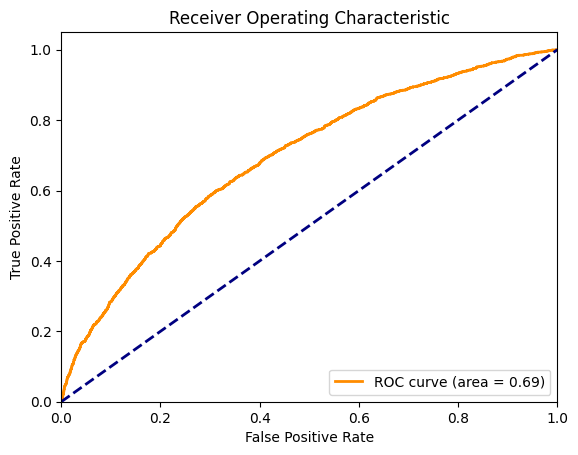

In [53]:
# Predict probabilities on the test set
y_probs = sgdc.predict_proba(valid_X)[:, 1]  # Probability scores for the positive class

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(valid_y, y_probs)
roc_auc = roc_auc_score(valid_y, y_probs)

# Print ROC AUC score
print("ROC AUC Score:", roc_auc)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [54]:
classificationSummary(valid_y, sgdc.predict(valid_X), class_names=['not_default', 'default'])

Confusion Matrix (Accuracy 0.6819)

            Prediction
     Actual not_default     default
not_default       10323        4611
    default         642         940


In [57]:
coefficients_unscaled_sgdc = scaler.inverse_transform(sgdc.coef_)
odds = pd.DataFrame({'coef': sgdc.coef_[0],
                'unscaled_coef': coefficients_unscaled_sgdc[0],
                'odds_ratio': np.exp(coefficients_unscaled_sgdc[0])}, index = train_X.columns)
sgdc_pred_test = sgdc.predict(valid_X)
sgdc_proba_test = sgdc.predict_proba(valid_X)
sgdc_result_test = pd.DataFrame({'actual': valid_y, 
                                  'predicted': sgdc_pred_test, 
              'prob_0': [p[0] for p in sgdc_proba_test],
              'prob_1': [p[1] for p in sgdc_proba_test]})
sgdc_result_test
classes = ['not default','default']
sgdc_importance = odds.sort_values(by=['odds_ratio'], ascending=False)
sgdc_importance.head(10)

,coef,unscaled_coef,odds_ratio
CB_AMT_CREDIT_SUM_OVERDUE_76-100k,1.590064,1.590064,4.904062
AMT_REQ_CREDIT_BUREAU_WEEK,0.598804,1.547885,4.701518
NAME_INCOME_TYPE_Employed,1.109093,1.109093,3.031609
CB_SEC_LOAN_0,0.864272,0.864272,2.373278
DEF_30_CNT_SOCIAL_CIRCLE,0.303935,0.705715,2.025294
OCCUPATION_TYPE_8_Operators_Assemblers,0.546727,0.546727,1.727589
NAME_EDUCATION_TYPE_Secondary,0.541917,0.541917,1.719299
OWN_CAR_AGE_21-25,0.501692,0.501692,1.651513
FLAG_OWN_CAR_N,0.437463,0.437463,1.548773
CB_AVG_DAYS_CREDIT_ENDDATE_2yrs+,0.297943,0.297943,1.347085


## XGBoost

In [58]:
!pip install xgboost
from xgboost import XGBClassifier


[notice] A new release of pip available: 22.3 -> 23.2.1
[notice] To update, run: pip install --upgrade pip


In [59]:
# Define model names and an empty list to store metric results
model_names = ['XGBoost']  # Replace with your model names
metric_results = []

# Loop through each model
for model_name in model_names:
    # Create and fit the model
    xgb = XGBClassifier(random_state = 1, n_estimators=100)
    xgb.fit(train_X, train_y)
    
    # Make predictions
    y_pred = xgb.predict(valid_X)
    y_probs = xgb.predict_proba(valid_X)[:, 1]
    
    # Calculate metrics
    roc_auc = round(roc_auc_score(valid_y, y_probs), 2)
    precision = round(precision_score(valid_y, y_pred), 2)
    accuracy = round(accuracy_score(valid_y, y_pred), 2)
    recall = round(recall_score(valid_y, y_pred), 2)
    f1 = round(f1_score(valid_y, y_pred), 2)
    
    # Append the metric results to the list
    metric_results.append([model_name,roc_auc, precision, accuracy, recall,f1])

# Create a DataFrame from the metric results
metrics_df = pd.DataFrame(metric_results, columns=['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score'])
combined_df = pd.concat([combined_df, metrics_df], ignore_index=True, axis=0)

# Print the metrics DataFrame
print(combined_df)

# Save the DataFrame to a CSV file
combined_df.to_csv('model_metrics.csv', index=False)


                      Model  ROC-AUC  Precision  Accuracy  Recall  F1_score
0             Decision_Tree     0.55       0.14      0.75    0.30      0.19
1  Logistic_Regression_Grid     0.69       0.16      0.64    0.64      0.26
2             Random_Forest     0.69       0.19      0.77    0.41      0.26
3       Random_Forest_tuned     0.69       0.20      0.84    0.22      0.21
4                       SGD     0.69       0.17      0.68    0.59      0.26
5                   XGBoost     0.67       0.22      0.86    0.18      0.20


ROC AUC Score: 0.6731032048810806


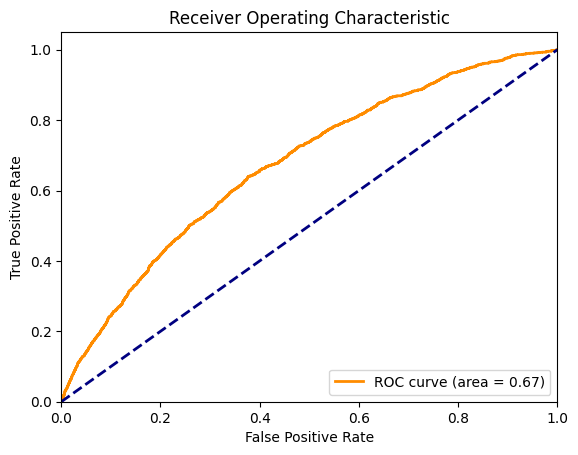

In [60]:
# Predict probabilities on the test set
y_probs = xgb.predict_proba(valid_X)[:, 1]  # Probability scores for the positive class

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(valid_y, y_probs)
roc_auc = roc_auc_score(valid_y, y_probs)

# Print ROC AUC score
print("ROC AUC Score:", roc_auc)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [61]:
classificationSummary(valid_y, xgb.predict(valid_X), class_names=['not_default', 'default'])

Confusion Matrix (Accuracy 0.8602)

            Prediction
     Actual not_default     default
not_default       13927        1007
    default        1302         280


In [65]:
xgb_df = pd.DataFrame({'feature': train_X.columns, 'importance': xgb.feature_importances_})
xgb_df.sort_values('importance', ascending = False).head(30)

,feature,importance
43,CB_SEC_LOAN_0,0.066008
62,CNT_ACTIVE_LOANS,0.052606
8,NAME_INCOME_TYPE_Employed,0.051434
21,NAME_EDUCATION_TYPE_Secondary,0.050395
40,CF_OBS_30_CNT_SOCIAL_CIRCLE,0.048842
27,CB_AVG_DAYS_CREDIT_ENDDATE_2yrs+,0.047044
60,INS_AVG_LATE_PAYMENT_zero,0.041042
13,FLAG_DOCUMENT_3_0,0.034954
69,OCCUPATION_TYPE_2_Professionals,0.032393
38,FLAG_OWN_CAR_N,0.031200


Text(0.5, 1.0, 'Top 30 Feature Importance - XGBoost')

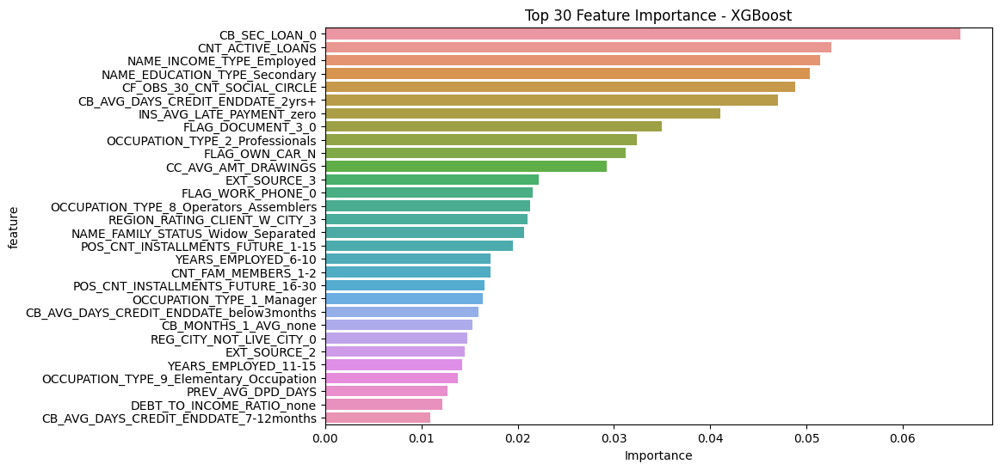

In [64]:
xgb_df = pd.DataFrame({'feature': train_X.columns, 'importance': xgb.feature_importances_})
                   
# Limit to top 30 features
top_30_df = xgb_df.sort_values('importance', ascending = False).head(30)
top_30_df = top_30_df.sort_values('importance', ascending=False)

# Create a horizontal bar plot using Seaborn
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
ax = sns.barplot(data=top_30_df, x='importance', y='feature')

# Set plot labels and title
ax.set_xlabel('Importance')
ax.set_title('Top 30 Feature Importance - XGBoost')

> XGBoost tuned

In [66]:
# Define model names and an empty list to store metric results
model_names = ['XGBoost_tuned']  # Replace with your model names
metric_results = []

# Loop through each model
for model_name in model_names:
    # Create and fit the model
    xgb_tuned = XGBClassifier(random_state = 1, scale_pos_weight = 1, learning_rate=0.02, n_estimators=600, 
                    objective='binary:logistic', nthread=1)
    xgb_tuned.fit(train_X, train_y)
    
    # Make predictions
    y_pred = xgb_tuned.predict(valid_X)
    y_probs = xgb_tuned.predict_proba(valid_X)[:, 1]
    
    # Calculate metrics
    roc_auc = round(roc_auc_score(valid_y, y_probs), 2)
    precision = round(precision_score(valid_y, y_pred), 2)
    accuracy = round(accuracy_score(valid_y, y_pred), 2)
    recall = round(recall_score(valid_y, y_pred), 2)
    f1 = round(f1_score(valid_y, y_pred), 2)
    
    # Append the metric results to the list
    metric_results.append([model_name,roc_auc, precision, accuracy, recall,f1])

# Create a DataFrame from the metric results
metrics_df = pd.DataFrame(metric_results, columns=['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score'])
combined_df = pd.concat([combined_df, metrics_df], ignore_index=True, axis=0)

# Print the metrics DataFrame
print(combined_df)

# Save the DataFrame to a CSV file
combined_df.to_csv('model_metrics.csv', index=False)


                      Model  ROC-AUC  Precision  Accuracy  Recall  F1_score
0             Decision_Tree     0.55       0.14      0.75    0.30      0.19
1  Logistic_Regression_Grid     0.69       0.16      0.64    0.64      0.26
2             Random_Forest     0.69       0.19      0.77    0.41      0.26
3       Random_Forest_tuned     0.69       0.20      0.84    0.22      0.21
4                       SGD     0.69       0.17      0.68    0.59      0.26
5                   XGBoost     0.67       0.22      0.86    0.18      0.20
6             XGBoost_tuned     0.69       0.23      0.86    0.17      0.20


ROC AUC Score: 0.6907375807958728


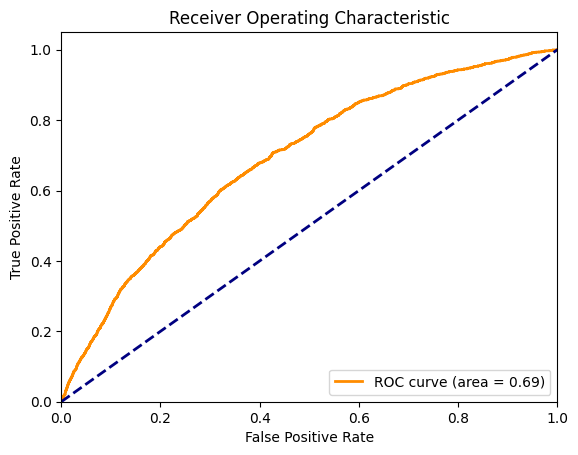

In [35]:
# Predict probabilities on the test set
y_probs = xgb_tuned.predict_proba(valid_X)[:, 1]  # Probability scores for the positive class

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(valid_y, y_probs)
roc_auc = roc_auc_score(valid_y, y_probs)

# Print ROC AUC score
print("ROC AUC Score:", roc_auc)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [67]:
classificationSummary(valid_y, xgb_tuned.predict(valid_X), class_names=['not_default', 'default'])

Confusion Matrix (Accuracy 0.8641)

            Prediction
     Actual not_default     default
not_default       13997         937
    default        1307         275


Text(0.5, 1.0, 'Top 30 Feature Importance - XGBoost')

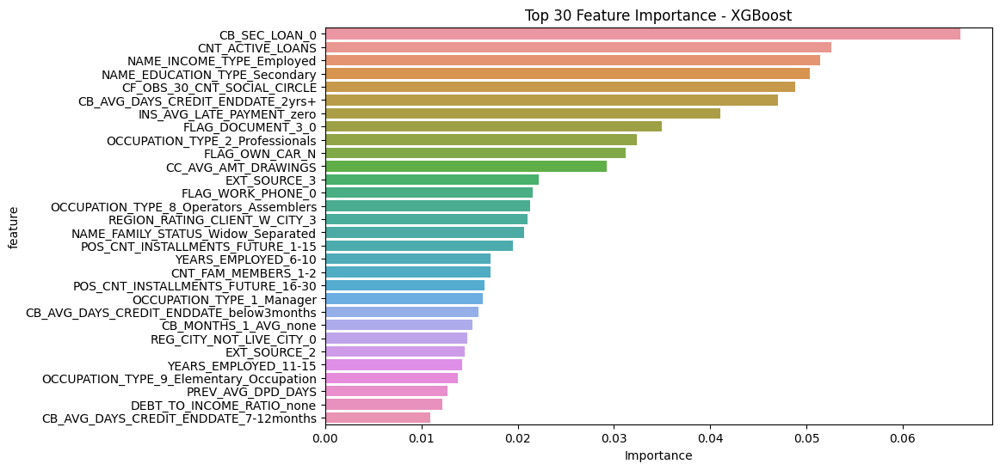

In [68]:
xgb_tuneddf = pd.DataFrame({'feature': train_X.columns, 'importance': xgb.feature_importances_})
                   
# Limit to top 30 features
top_30_df = xgb_tuneddf.sort_values('importance', ascending = False).head(30)
top_30_df = top_30_df.sort_values('importance', ascending=False)

# Create a horizontal bar plot using Seaborn
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
ax = sns.barplot(data=top_30_df, x='importance', y='feature')

# Set plot labels and title
ax.set_xlabel('Importance')
ax.set_title('Top 30 Feature Importance - XGBoost')

## Ada Boost

In [41]:
# Define model names and an empty list to store metric results
model_names = ['AdaBoost']  # Replace with your model names
metric_results = []

# Loop through each model
for model_name in model_names:
    # Create and fit the model
    ada = AdaBoostClassifier(DecisionTreeClassifier(random_state=1, class_weight = 'balanced',
        max_depth= 30, min_impurity_decrease= 0.0001, min_samples_split= 2), n_estimators=250, random_state=1) # Replace with your model initialization
    ada.fit(train_X, train_y)
    
    # Make predictions
    y_pred = ada.predict(valid_X)
    y_probs = ada.predict_proba(valid_X)[:, 1]
    
    # Calculate metrics
    roc_auc = round(roc_auc_score(valid_y, y_probs), 2)
    precision = round(precision_score(valid_y, y_pred), 2)
    accuracy = round(accuracy_score(valid_y, y_pred), 2)
    recall = round(recall_score(valid_y, y_pred), 2)
    f1 = round(f1_score(valid_y, y_pred), 2)
    
    # Append the metric results to the list
    metric_results.append([model_name,roc_auc, precision, accuracy, recall, f1])

# Create a DataFrame from the metric results
metrics_df = pd.DataFrame(metric_results, columns=['Model', 'ROC-AUC','Precision', 'Accuracy', 'Recall','F1_score'])
combined_df = pd.concat([combined_df, metrics_df], ignore_index=False, axis=0)

# Print the metrics DataFrame
print(combined_df)

# Save the DataFrame to a CSV file
combined_df.to_csv('model_metrics.csv', index=False)


                      Model  ROC-AUC  Precision  Accuracy  Recall  F1_score
0             Decision_Tree     0.55       0.14      0.75    0.30      0.19
1  Decision_Tree_GridSearch     0.53       0.14      0.74    0.33      0.20
2  Logistic_Regression_Full     0.69       0.16      0.64    0.64      0.26
3    Logistic_Regression_CV     0.69       0.16      0.64    0.64      0.26
4       Random_Forest_tuned     0.69       0.20      0.84    0.22      0.21
5                       SGD     0.69       0.17      0.68    0.59      0.26
6                   XGBoost     0.67       0.22      0.86    0.18      0.20
7             XGBoost_tuned     0.69       0.23      0.86    0.17      0.20
8             Random_Forest     0.69       0.19      0.77    0.41      0.26
0                  AdaBoost     0.67       0.25      0.88    0.12      0.16


ROC AUC Score: 0.6696837344323452


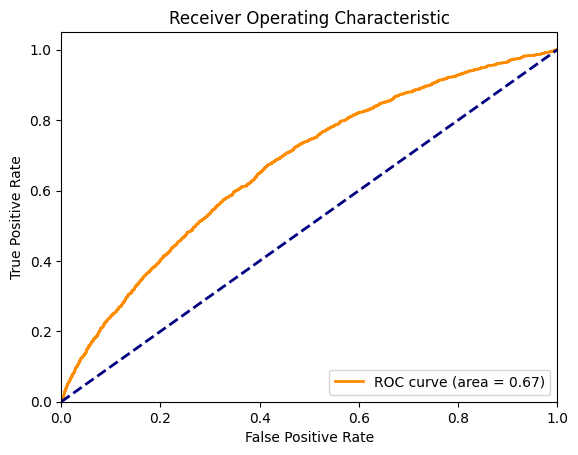

In [42]:
# Predict probabilities on the test set
y_probs = ada.predict_proba(valid_X)[:, 1]  # Probability scores for the positive class

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(valid_y, y_probs)
roc_auc = roc_auc_score(valid_y, y_probs)

# Print ROC AUC score
print("ROC AUC Score:", roc_auc)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [43]:
combined_df

,Model,ROC-AUC,Precision,Accuracy,Recall,F1_score
0,Decision_Tree,0.55,0.14,0.75,0.30,0.19
1,Decision_Tree_GridSearch,0.53,0.14,0.74,0.33,0.20
2,Logistic_Regression_Full,0.69,0.16,0.64,0.64,0.26
3,Logistic_Regression_CV,0.69,0.16,0.64,0.64,0.26
4,Random_Forest_tuned,0.69,0.20,0.84,0.22,0.21
5,SGD,0.69,0.17,0.68,0.59,0.26
6,XGBoost,0.67,0.22,0.86,0.18,0.20
7,XGBoost_tuned,0.69,0.23,0.86,0.17,0.20
8,Random_Forest,0.69,0.19,0.77,0.41,0.26
0,AdaBoost,0.67,0.25,0.88,0.12,0.16


# Best Model

> Random Forest

In [48]:
importance = rf.feature_importances_ #%of the variance that can be explained by that variable
#adds up to 1
std=np.std([tree.feature_importances_ for tree in rf.estimators_], axis=0)
rf_df = pd.DataFrame({'feature': train_X.columns,
                   'importance': importance})
rf_df.sort_values('importance', ascending = False)

,feature,importance
23,EXT_SOURCE_3,1.277071e-01
35,EXT_SOURCE_2,9.154296e-02
20,EXT_SOURCE_1,6.519267e-02
56,CC_AVG_AMT_DRAWINGS,5.489627e-02
27,CB_AVG_DAYS_CREDIT_ENDDATE_2yrs+,5.306815e-02
...,...,...
55,AMT_REQ_CREDIT_BUREAU_HOUR,4.184787e-09
57,CB_AMT_CREDIT_SUM_OVERDUE_100+,0.000000e+00
7,DEBT_TO_INCOME_RATIO_81pct_andup,0.000000e+00
67,CB_AMT_CREDIT_SUM_OVERDUE_51-75k,0.000000e+00


Text(0.5, 1.0, 'Top 30 Feature Importance - Random Forest')

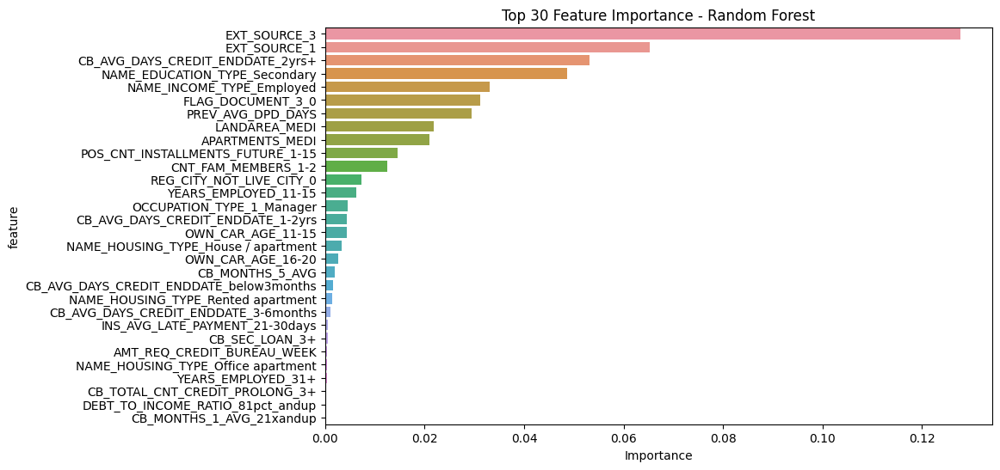

In [49]:
import seaborn as sns
# Limit to top 30 features
top_20_df = rf_df.head(30)
top_20_df = top_20_df.sort_values('importance', ascending=False)

# Create a horizontal bar plot using Seaborn
plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
ax = sns.barplot(data=top_20_df, x='importance', y='feature')

# Set plot labels and title
ax.set_xlabel('Importance')
ax.set_title('Top 30 Feature Importance - Random Forest')

In [50]:
classificationSummary(valid_y, rf.predict(valid_X))

Confusion Matrix (Accuracy 0.7745)

       Prediction
Actual     0     1
     0 12151  2783
     1   941   641


In [51]:
importance = rf_tuned.feature_importances_ #%of the variance that can be explained by that variable
#adds up to 1
std=np.std([tree.feature_importances_ for tree in rf_tuned.estimators_], axis=0)
rf_df = pd.DataFrame({'feature': train_X.columns,
                   'importance': importance})
rf_df.sort_values('importance', ascending = False)

,feature,importance
23,EXT_SOURCE_3,0.104575
35,EXT_SOURCE_2,0.084820
20,EXT_SOURCE_1,0.062312
56,CC_AVG_AMT_DRAWINGS,0.048537
40,CF_OBS_30_CNT_SOCIAL_CIRCLE,0.044841
...,...,...
5,CB_MONTHS_1_AVG_21xandup,0.000000
7,DEBT_TO_INCOME_RATIO_81pct_andup,0.000000
46,CB_AMT_CREDIT_SUM_OVERDUE_26-50k,0.000000
67,CB_AMT_CREDIT_SUM_OVERDUE_51-75k,0.000000


# Validation and Governance

Variable Monitoring

In [77]:
df2 = df.copy()

In [78]:
df2 = df2.apply(lambda x: abs(x))

In [79]:
final_variables = rf_df[rf_df['importance'] > 0]

In [80]:
final_variables = list(final_variables['feature'].unique())

In [81]:
df2[final_variables].describe().T

,count,mean,std,min,25%,50%,75%,max
CB_SEC_LOAN_3+,33032.0,0.004269,0.065196,0.0,0.0,0.0,0.0,1.000000
POS_CNT_INSTALLMENTS_FUTURE_1-15,33032.0,0.425012,0.494352,0.0,0.0,0.0,1.0,1.000000
CB_TOTAL_CNT_CREDIT_PROLONG_3+,33032.0,0.001726,0.041505,0.0,0.0,0.0,0.0,1.000000
YEARS_EMPLOYED_31+,33032.0,0.006418,0.079856,0.0,0.0,0.0,0.0,1.000000
CB_MONTHS_5_AVG,33032.0,0.048732,0.359362,0.0,0.0,0.0,0.0,6.022368
...,...,...,...,...,...,...,...,...
OWN_CAR_AGE_21-25,33032.0,0.019194,0.137207,0.0,0.0,0.0,0.0,1.000000
CF_CB_MONTHS_0_AVG,33032.0,9.043860,5.541420,0.0,5.0,8.0,12.0,22.500000
DEBT_TO_INCOME_RATIO_none,33032.0,0.282514,0.450229,0.0,0.0,0.0,1.0,1.000000
OCCUPATION_TYPE_2_Professionals,33032.0,0.069690,0.254628,0.0,0.0,0.0,0.0,1.000000
